# House Price Analysis In Jakarta (EDA)

<li>Eksploratory Data Analysis ini akan mengeksplorasi fitur-fitur yang digunakan dalam menentukan Harga Jual sebuah rumah di kawasan Jakarta.
<li>Dataset yang digunakan merupakan data dari hasil web scraping dari situs webiste jual beli properti. Dataset ini terdiri dari semua fitur yang membantu dalam memprediksi harga jual sebuah rumah.

In [1]:
# Instalasi Library
import pandas as pd
from geopy.geocoders import ArcGIS
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import seaborn as sns
import folium
from folium.plugins import HeatMap
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from shapely.geometry import Point

In [2]:
# Read CSV file
df = pd.read_csv('lamudi_clean_data.csv')

In [30]:
# Data Loading
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2565 entries, 0 to 2564
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   kota                2565 non-null   object 
 1   lokasi              2565 non-null   object 
 2   luas_lahan          2565 non-null   int64  
 3   luas_bangunan       2565 non-null   int64  
 4   kamar_tidur         2565 non-null   int64  
 5   kamar_mandi         2565 non-null   int64  
 6   keamanan_24jam      2565 non-null   object 
 7   taman_bermain_anak  2565 non-null   object 
 8   harga               2565 non-null   float64
dtypes: float64(1), int64(4), object(4)
memory usage: 180.5+ KB


Dalam data hasil scrape yang dikumpulkan, terdapat total 2.565 data rumah beserta 9 variabel yang terkait dengan spesifikasi rumah tersebut yang akan dianalisis lebih lanjut. Berikut ini informasi detail terkait data:

| Variable Name          | Data Information                                                   |
|------------------------|-------------------------------------------------------------------|
| city                   | is the name of the city this property is located in               |
| location               | is the detailed location of the property, including the area and complete address of the property |
| land_area              | information on the land area of the property in square meters     |
| building_area          | information on the building area of the property in square meters |
| bed_rooms              | is the number of bedrooms in the property                         |
| bathroom_room          | is the number of bathrooms in the property                        |
| 24hour_security        | information regarding whether the property has 24 hour security facilities |
| children's_playground  | information about whether the property has children's playground facilities |
| price                  | is information on the price of the property in rupiah             |


## Geospatial data analysis

Analisis data geospasial melibatkan pengumpulan, penggabungan, dan visualisasi berbagai jenis data geospasial. Dalam hal ni digunakan untuk mengevaluasi dan menganalisis bagaimana tren harga jual rumah dapat bervariasi antar lokasi di Jakarta.   

Tahpan analisis yang dilakukan:
1. Melakukan ekstraksi data untuk mendapat titik koordinat latitude dan longitude
2. Menggunakan sumber data dari Indonesia - Subnational Administrative Boundaries sebagai referensi untuk menentukan lokasi subdsitricts (kecamatan) berdasarkan data titik koordinat latitude dan longitude.
3. Menginterpretasikan data geografis untuk mengungkap, menganalisis, dan memvisualisasikan informasi tentang eksplorasi hubungan spasial antara kumpulan data lokasi yang berbeda.

Untuk menjalankan analisis data geospasial, dibutuhkan file Jakarta sub-districts shapefile yang bernama idn_adm_bps_20200401_shp (seluruh file ini harus ditempatkan pada direktori yang sama dengan direktori notebook), berikut ini link download untuk dapat mengkases file:

https://data.humdata.org/dataset/cod-ab-idn

*sumber data dari Indonesia - Subnational Administrative Boundaries*

In [3]:
# Extracts complete address data
def extract_last_two(loc):
    parts = loc.split(', ')
    return ', '.join(parts[-2:])
df['lokasi'] = df['lokasi'].apply(extract_last_two)

In [4]:
# Splitting the dataframe into several parts before latitude and longitude data extraction
dfs = []
for i in range(5):
    dfs.append(df.iloc[i*433 : (i+1)*433])
# Last dataframe gets the remaining rows
dfs.append(df.iloc[5*433:])

In [5]:
# Using python geocoders to get latitude and longitude data
def get_lat_lon(location):
    nom = ArcGIS(timeout=10)
    geo = nom.geocode(location)
    if geo:  # check if location was found
        return geo.latitude, geo.longitude
    else:  # return None if location not found
        return None, None

In [ ]:
# Obtain latitude and longitude data from dataframe part 1 
# (total extract time reaches around 10 minutes)
dfs[0]['latitude'], dfs[0]['longitude'] = zip(*dfs[0]['lokasi'].apply(get_lat_lon))

In [ ]:
# Obtain latitude and longitude data from dataframe part 2 
dfs[1]['latitude'], dfs[1]['longitude'] = zip(*dfs[1]['lokasi'].apply(get_lat_lon))

In [ ]:
# Obtain latitude and longitude data from dataframe part 3 
dfs[2]['latitude'], dfs[2]['longitude'] = zip(*dfs[2]['lokasi'].apply(get_lat_lon))

In [ ]:
# Obtain latitude and longitude data from dataframe part 4 
dfs[3]['latitude'], dfs[3]['longitude'] = zip(*dfs[3]['lokasi'].apply(get_lat_lon))

In [ ]:
# Obtain latitude and longitude data from dataframe part 5 
dfs[4]['latitude'], dfs[4]['longitude'] = zip(*dfs[4]['lokasi'].apply(get_lat_lon))

In [ ]:
# Obtain latitude and longitude data from dataframe part 6 
dfs[5]['latitude'], dfs[5]['longitude'] = zip(*dfs[5]['lokasi'].apply(get_lat_lon))

In [12]:
# Recombine data
dfs = [dfs[0], dfs[1], dfs[2], dfs[3], dfs[4], dfs[5]]
df = pd.concat(dfs, ignore_index=True)

### Identifying spatial patterns and trends

In [21]:
# Visualization to segment House Price based on Geography Districts
# Convert dataframe to GeoDataFrame
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
# Read file using Geopandas
gdf = gpd.GeoDataFrame(df, geometry=geometry)
# Add "Region " prefix to each name in the 'region' column
gdf['kota_adm'] = gdf['kota'].apply(lambda x: 'Kota ' + x)
# Read shape file using Geopandas
shp_data = gpd.read_file('idn_admbnda_adm2_bps_20200401.shp')
# For the point dataset:
gdf.crs = "EPSG:4326"
# For the sub-districts dataset:
shp_data.crs = "EPSG:4326"
avg_price = gdf.groupby('kota_adm')['harga'].mean().reset_index()
merged_data = shp_data.merge(avg_price, left_on="ADM2_EN", right_on="kota_adm")
merged_data = merged_data.rename(columns={'harga': 'Average_Price'})
fig = px.choropleth(
    merged_data,
    geojson=merged_data.geometry,
    locations=merged_data.index,
    color='Average_Price',
    hover_name='ADM2_EN',
    hover_data=['Average_Price'],
    color_continuous_scale='YlGn',
    title='Average House Prices per District in Jakarta'
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(width=1000, height=800)
fig.show()

<Axes: title={'center': 'Average House Prices per District in Jakarta'}>

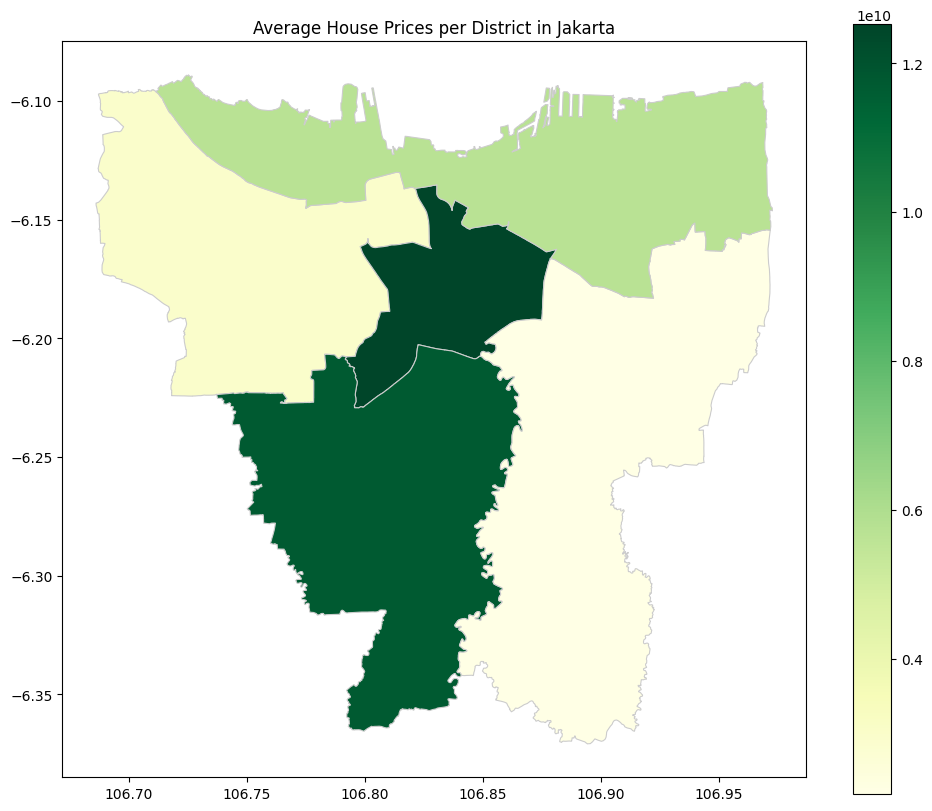

In [22]:
# More simplified Visualization (Visualization without using an interactive basis)
# Set up the figure and axis
fig, ax = plt.subplots(figsize=(12, 10))
# Plot the Choropleth map
merged_data.plot(column='Average_Price', cmap='YlGn', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
# Set the title
ax.set_title('Average House Prices per District in Jakarta')
ax

Pada visualisasi diatas, dapat disimpulkan:
1. Kawasan Jakarta Pusat memiliki harga rumah yang paling tinggi dibandingkan dengan kawasan lain di Jakarta, dengan estimasi rata-rata harga rumah adalah Rp 12,5 Miliar. Hal ini dapat dikatikan dengan fakta bahwa wilayah administrasi kota Jakarta Pusat merupakan kawasan pusat bisnis dan pemerintahan di Ibukota DKI Jakarta, sehingga wajar apabila kisaran harga rumah di kawasan ini tergolong yang paling mahal.  
2. Di posisi kedua di urutan harga tertinggi adalah untuk kawasan Jakarta Selatan, dengan harga rumah rata-rata adalah Rp 11 Miliar. Sebagaimana diketahui Jakarta Selatan merupakan wilayah administrasi yang menjadi pusat bisnis dan juga hiburan di Jakarta.
3. Sedangkan untuk harga rumah yang terendah berdasarkan data ini adalah di kawasan Jakarta Timur, dengan estimasi harga rata-rata Rp 2,1 Miliar. Hal ini mungkin dapat dikaitkan dengan wilayah jakarta Timur yang memiliki lebih sedikit jumlah gedung-gedung perkantoran dan pusat perbelanjaan yang mewah, dibandingkan dengan kawasan lainnya.    

In [25]:
# Sub-District Data extraction process
# Convert dataframe to GeoDataFrame with WGS84 CRS
geometry = gpd.points_from_xy(df.longitude, df.latitude)
gdf = gpd.GeoDataFrame(df, geometry=geometry)
# Load Jakarta sub-districts shapefile or GeoJSON
subdistricts = gpd.read_file('idn_admbnda_adm4_bps_20200401.shp')
# For the point dataset:
gdf.crs = "EPSG:4326"
# For the sub-districts dataset:
subdistricts.crs = "EPSG:4326"
# Spatial join to match each point with a sub-district
joined = gpd.sjoin(gdf, subdistricts, how="left", predicate="within")
# Add sub-district name to the original dataframe
df['kecamatan'] = joined['ADM3_EN']

In [26]:
# Heatmap Visualization of House Prices based on Subdistricts
# Convert dataframe to GeoDataFrame
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)
shp_data = gpd.read_file('idn_admbnda_adm3_bps_20200401.shp')
# For the point dataset:
gdf.crs = "EPSG:4326"
# For the sub-districts dataset:
shp_data.crs = "EPSG:4326"
avg_price = gdf.groupby('kecamatan')['harga'].mean().reset_index()
merged_data = shp_data.merge(avg_price, left_on="ADM3_EN", right_on="kecamatan")
def format_price(price):
    billion = 1_000_000_000
    if price >= billion:
        return f"Rp. {price/billion:.1f} Miliar"
    return str(price)
merged_data['formatted_price'] = merged_data['harga'].apply(format_price)
avg_price['harga_miliar'] = avg_price['harga'].apply(lambda x: round(x / 1_000_000_000, 2))

m = folium.Map(location=[-6.211, 106.845], zoom_start=11, tiles='OpenStreetMap')
folium.Choropleth(
    geo_data=merged_data,
    name='choropleth',
    data=avg_price,
    columns=['kecamatan', 'harga_miliar'],
    key_on='feature.properties.ADM3_EN',
    fill_color='YlGn',
    fill_opacity=0.5,
    line_opacity=0.2,
    legend_name='Average House Price  in Billions of Rp'
).add_to(m)
# Add hover functionality using GeoJsonTooltip
folium.GeoJson(
    merged_data,
    style_function=lambda x: {
        'weight': 0.01,  # boundary line thickness
        'fillOpacity': 0
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['kecamatan', 'formatted_price'],
        aliases=['Kecamatan:', 'Average House Price:']
    )
    
).add_to(m)
# Display The Visualization
m

In [16]:
# Saving Visualization into html file
m.save('average_price_per_sudistrict.html')

**Analisis Harga Rumah per Kecamatan:**
<li> Kecamatan dengan harga rata-rata rumah yang paling tinggi adalah di kawasan Menteng, Jakarta Pusat. Sebagaimana sudah umum diketahui Menteng memang merupakan kawasan penting di Jakarta. Banyak rumah besar, yang kini harganya sangat tinggi, berdiri di sana sejak zaman Hindia Belanda. Banyak rumah-rumah mewah dikarenakan lokasinya yang sangat strategis dan di pusat ibu kota, Jakarta Pusat.
<li> Di urutan tertinggi kedua pada data ini adalah pada area Setiabudi, Jakarta Selatan. Ini dapat dikaitkan dengan fakta bahwa mayoritas gedung perkantoran dan aksesnya yang sangat dekat dengan pusat perbelanjaan berada di wilayah ini, menjadikan rumah-rumah dikawasan ini menjadi prestisius dan banyak menjadi idaman para penduduk DKI Jakarta.
<li> Jika dilihat dari sisi geografis, terlihat bahwa ada kecenderungan posisi-posisi kecamatan yang berlokasi di tengah-tengah DKI Jakarta memiliki harga yang paling mahal dibandingan dengan kawasan-kawasan yang jauh dari titik tengah. Sehingga terindikasi rumah-rumah yang semakin jauh berada pada titik tengah denah DKI Jakarta, maka ada kecenderungan memiliki estimasi harga rata-rata rumah yang semakin rendah.

In [27]:
# Visualization of House Price Data Distributions
jakarta_coords = [-6.2088, 106.8456]
m = folium.Map(location=jakarta_coords, zoom_start=12)

# Function to determine icon color based on house price
def determine_icon_color(harga):
    if harga < 2.5e9:
        return 'darkgreen'
    elif 2.5e9 <= harga < 5e9:
        return 'green'
    elif 5e9 <= harga < 10e9:
        return 'orange'
    else:
        return 'red'

def format_price(price):
    billion = 1_000_000_000
    return f"Rp.{price/billion} Miliar"


# Add a marker for each property
for _, row in df.iterrows():
    formatted_price = format_price(row['harga'])
    popup_content = f"""
    Harga Rumah: {formatted_price}<br>
    Kecamatan: {row['kecamatan']}<br>
    Kota: {row['kota']}<br>
    Luas Lahan: {row['luas_lahan']} m2
    """
    folium.Marker(
        location=(row['latitude'], row['longitude']),
        popup=popup_content, 
        icon=folium.Icon(icon="home", color=determine_icon_color(row['harga']))
    ).add_to(m)

# Display The Visualization
m

In [18]:
# Saving Visualization into html file
m.save('map_house_price.html')

**Insight:**       
Dapat teridentifikasi bahwa dari sebaran data rumah di DKI Jakarta, mayoritas rumah-rumah yang memiliki harga rata-rata diatas Rp 10 Miliar (ditandai dengan warna merah) terlihat berpusat pada titik-titik tertentu dan cenderung tidak merata. Sehingga dapat dindikasikan kawasan atau lokasi-lokasi tertentu di daerah DKI Jakarta menjadi faktor yang signifikan dalam menentukan estimasi harga rumah.   

In [28]:
# Compute average house price for each subdistrict
avg_prices = df.groupby('kecamatan').harga.mean().reset_index()
# Sort districts by average house price in descending order and take the top 10
top_10_subdistricts = avg_prices.sort_values(by='harga', ascending=False).head(10)

# Process the district names so that long names split into two rows
def process_label(label):
    if len(label) > 10: 
        midpoint = len(label) // 2
        return label[:midpoint] + "<br>" + label[midpoint:]
    return label

top_10_subdistricts['kecamatan'] = top_10_subdistricts['kecamatan'].apply(process_label)


# Bar Plot using plotly
fig = px.bar(top_10_subdistricts, x='kecamatan', y='harga', 
             title='Top 10 Subdistricts with the Highest Average House Prices',
             labels={'harga': 'Average Price', 'kecamatan': 'Subdistrict', 'kota': 'City'})


fig.show()

1. Kecamatan Menteng, Setua Budi, Kebayoran Baru, dan Kebayoran Lama menjadi kecamatan dengan rata-rata harga rumah tertinggi dengan nilai rata-rata diatas Rp 20 Miliar. 
2. Kecamatan dengan harga rumah rata-rata di kisaran belasan miliar rupiah adalah Mampang dan Sawah Besar.
3. Untuk Mayoritas Kecamatan di DKI Jakarta lainnya pada data ini memiliki harga rata-rata dibawah Rp 10 Miliar. 
4. Secara keseluruhan, Kecamatan yanng memiliki harga rata-rata tertinggi didominasi dari Kecamatan yang terletak di Wilayah Jakarta Selatan. 

In [29]:
# Visualization: Percentage of Houses in Each District by Price Range
# Define function to segment data into price ranges
def price_range(x):
    if x < 2.5e9:
        return '<2.5B'
    elif x < 10e9:
        return '2.5B-10B'
    elif x < 20e9:
        return '10B-20B'
    else:
        return '>20B'

df['price_segment'] = df['harga'].apply(price_range)
# Create a subplot layout of 1 row and 4 columns
fig = make_subplots(rows=1, cols=4, subplot_titles=('<2.5B', '2.5B-10B', '10B-20B', '>20B'))

price_segments = ['<2.5B', '2.5B-10B', '10B-20B', '>20B']
for i, segment in enumerate(price_segments, start=1):
    subset = df[df['price_segment'] == segment]
    total_houses = len(subset)
    
    district_counts = subset['kota'].value_counts()
    district_percentages = (district_counts / total_houses) * 100
    
    fig.add_trace(
        go.Bar(x=district_percentages.index, y=district_percentages, name=segment),
        row=1, col=i
    )

fig.update_layout(title_text="Percentage of Houses in Each District by Price Range")
fig.show()

In [30]:
# Percentage of Houses in Each Price Segment by District  
# 1. Determine price segment for each house
def price_segment(price):
    if price < 2.5e9:
        return '<2.5B'
    elif 2.5e9 <= price <= 5e9:
        return '2.5B-5B'
    else:
        return '>5B'

df['price_segment'] = df['harga'].apply(price_segment)

# 2. Calculate the percentage of houses in each price segment per district
districts = ['Jakarta Selatan', 'Jakarta Pusat', 'Jakarta Utara', 'Jakarta Barat', 'Jakarta Timur']
percentages = df.groupby(['kota', 'price_segment']).size().unstack(fill_value=0)
percentages = percentages.div(percentages.sum(axis=1), axis=0) * 100

# 3-4. Create and arrange the pie charts
fig = make_subplots(rows=2, cols=3, subplot_titles=districts, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}], [{'type':'domain'}, {'type':'domain'}, None]])

for i, district in enumerate(districts):
    row = i // 3 + 1
    col = i % 3 + 1
    fig.add_trace(go.Pie(labels=percentages.columns, values=percentages.loc[district].values, name=district, title=district), row=row, col=col)

fig.update_layout(title_text='Percentage of Houses in Each Price Segment by District')
fig.show()

1. Jakarta Selatan merupakan kawasan dengan jumlah rumah terbanyak yang memiliki harga diatas Rp 5 Miliar, kemudian disusul oleh wilayah Jakarta Utara dan Jakarta Pusat.
2. Untuk rumah dengan harga di antara Rp 2 Miliar hingga 5 Miliar paling banyak dapat ditemukan dikawasan Jakarta Utara.
3. Kawasan Jakarat Timur memiliki paling banyak harga rumah dibawah Rp 2,5 Miliar atau sekitar 71% dari seluruh rumah memiliki nilai rumah dibawah nilai ini, sehingga relatif paling banyak rumah yang murah berada pada lokasi Jakarta Timur.

## Exploratory Data Analysis

In [31]:
# Visualization to compare house price data based on land and building area
df_filtered = df[df['harga'] < 30e9]
fig = make_subplots(rows=1, cols=2, subplot_titles=('Land Area vs. Price', 'Building Area vs. Price'))

# Add scatter plots to the subplots
land_vs_price = go.Scatter(x=df_filtered['luas_lahan'], y=df_filtered['harga'], mode='markers', name='Land Area')
building_vs_price = go.Scatter(x=df_filtered['luas_bangunan'], y=df_filtered['harga'], mode='markers', name='Building Area')

fig.add_trace(land_vs_price, row=1, col=1)
fig.add_trace(building_vs_price, row=1, col=2)

# Update layout and axis titles
fig.update_layout(title_text="Comparison of Price vs. Area", )
fig.update_xaxes(title_text="Land Area (m2)", row=1, col=1)
fig.update_yaxes(title_text="Price (Rp)", row=1, col=1)
fig.update_xaxes(title_text="Building Area (m2)", row=1, col=2)
fig.update_yaxes(title_text="Price (Rp)", row=1, col=2)

fig.show()

<li> Pada data ini, mayoritas rumah memiliki luas lahan dibawah 500 meter persegi, dan juga terlihat pola yang sama pada data luas bangunan, dimana mayoritas pada data ini juga memiliki luas dibawah 500 meter persegi. 

<li> Terlihat semakin tinggi luas lahan atau luas bangunan suatu rumah, terindikasi semakin tinggi harga suatu rumah tersebut. Sehingga dapat dikatakan ada kecenderungan hubungan yang linear antara luas lahan dan luas bangunan terhadap harga suatu rumah.

In [32]:
# Visualization to compare house price data based on the number of bedrooms and bathrooms
# Functions to determine range
def bedroom_range(x):
    if x <= 2:
        return "1-2"
    elif x <= 4:
        return "3-4"
    elif x <= 6:
        return "5-6"
    else:
        return "7+"

def bathroom_range(x):
    if x <= 2:
        return "1-2"
    elif x <= 4:
        return "3-4"
    elif x <= 6:
        return "5-6"
    else:
        return "7+"

df['bedroom_range'] = df['kamar_tidur'].apply(bedroom_range)
avg_prices_bedroom = df.groupby('bedroom_range').harga.mean().reset_index()

df['bathroom_range'] = df['kamar_mandi'].apply(bathroom_range)
avg_prices_bathroom = df.groupby('bathroom_range').harga.mean().reset_index()

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=('By Number of Bedrooms', 'By Number of Bathrooms'))

# Add bedroom data to the left subplot
fig.add_trace(
    go.Bar(x=avg_prices_bedroom['bedroom_range'], y=avg_prices_bedroom['harga'], name='Bedrooms'),
    row=1, col=1
)

# Add bathroom data to the right subplot
fig.add_trace(
    go.Bar(x=avg_prices_bathroom['bathroom_range'], y=avg_prices_bathroom['harga'], name='Bathrooms'),
    row=1, col=2
)

# Update layout
fig.update_layout(title_text="Average House Prices in Rp", showlegend=False)

fig.show()


<li> Terlihat dengan jelas berdasarkan perbandingan rata-rata harga rumah, semakin banyak suatu rumah memiliki jumlah kamar tidur atau kamar mandi, semakin tinggi juga potensi harga rumah tersebut. Ini juga mengindikasikan terdapat hubungan linear antara jumlah ruang kamar tidur dan kamar mandi dengan harga dari suatu rumah. 

In [33]:
# Visualization to Compute average number of bedrooms and bathrooms for each price segment
# Segment data into price ranges
def price_range(x):
    if x < 2.5e9:
        return '<2.5B'
    elif x <= 5e9:
        return '2.5B-5B'
    elif x <= 10e9:
        return '5B-10B'
    else:
        return '>10B'

df['price_segment'] = df['harga'].apply(price_range)

# Compute average number of bedrooms and bathrooms for each price segment
avg_data = df.groupby('price_segment').agg({
    'kamar_tidur': 'mean',
    'kamar_mandi': 'mean'
}).reset_index()

avg_data['kamar_tidur'] = avg_data['kamar_tidur'].astype(int)
avg_data['kamar_mandi'] = avg_data['kamar_mandi'].astype(int)

# Grouped Bar Plot using plotly
fig = px.bar(avg_data, x='price_segment', y=['kamar_tidur', 'kamar_mandi'],
             title='Average Number of Bedrooms and Bathrooms by Price Range',
             labels={'value': 'Average Number of room', 'price_segment': 'Price Range', 'variable': 'Room Type'},
             barmode='group',
             category_orders={'price_segment': ['<2.5B', '2.5B-5B', '5B-10B', '>10B']})

fig.show()

<li> Pada harga rata-rata dibawah Rp 2,5 Miliar, rata-rata memiliki jumlah kamar tidur 2 dan jumlah kamar mandi juga 2.
<li> Pada range harga Rp 2,5 Miliar hingga 10 Miliar, terlihat rumah memiliki rata-rata kamar tidur dan kamar mandi berjumlah 4.
<li> Teridentifikasi bahwa semakin tinggi harga rumah, maka semakin banyak ruang kamar tidur dan kamar mandi yang dimiliki. 

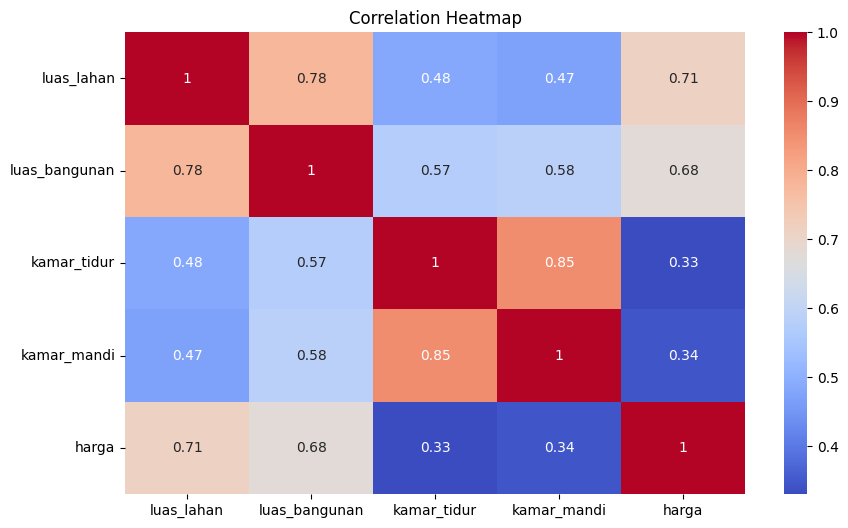

In [34]:
# Correlation Heatmap
correlation = df[['luas_lahan', 'luas_bangunan', 'kamar_tidur', 'kamar_mandi', 'harga']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

Interpretasi Analisis Korelasi:
1. luas_lahan: 0,71 (Korelasi positif yang kuat)       
Artinya: Semakin bertambah luas tanah maka harga rumah cenderung meningkat pula. Hubungan yang cukup kuat menunjukkan bahwa luas tanah merupakan faktor yang signifikan dalam menentukan harga rumah.
2. luas_bangunan: 0,67 (Korelasi positif moderat)        
Artinya: Terdapat hubungan yang cukup kuat dan positif antara luas bangunan dan harga rumah. Luas bangunan yang lebih luas berhubungan dengan harga rumah yang lebih tinggi, dan faktor ini juga cukup signifikan dalam menentukan harga rumah.
3. kamar_tidur: 0,33 (Korelasi positif namun relatif lemah)         
Artinya: Meskipun terdapat hubungan positif antara jumlah kamar tidur dan harga rumah, namun hubungannya tidak terlalu kuat. Faktor lain mungkin lebih berpengaruh terhadap harga rumah dibandingkan jumlah kamar tidur.
4. kamar_mandi: 0,34 (Korelasi positif namun relatif lemah)        
Artinya: Seperti halnya jumlah kamar tidur, meskipun lebih banyak kamar mandi dapat dikaitkan dengan harga yang lebih tinggi karena korelasinya postifi, namun koefisiennya dibawha 0.7, sehingga hal ini dapat dikatakan tidak memiliki hubungan yang kuat.

Kesimpulan Analisis Korelasi:
<li>Luas tanah dan luas bangunan tampaknya menjadi faktor yang lebih signifikan dalam menentukan harga rumah dibandingkan jumlah kamar tidur dan kamar mandi dalam analisis ini.
<li>Korelasi tidak berarti sebab-akibat. Jadi, meskipun variabel-variabel ini mungkin terkait dengan harga rumah, bukan berarti variabel-variabel tersebut menyebabkan perubahan harga rumah. Analisis statistik lebih lanjut (seperti regresi) diperlukan untuk mengeksplorasi hubungan sebab akibat.